In [1]:
import pandas as pd
import numpy as np
import scipy

import matplotlib.pyplot as plt
import seaborn as sns

from google.cloud import bigquery as bq

%matplotlib inline

# All sig-DMDs
## Meth matrix

In [2]:
subtype_meth_bigtable = pd.read_table("./datasets/subtype_meth_bigtable.HM450.tsv", sep="\t")

print(subtype_meth_bigtable.shape)
subtype_meth_bigtable.head()

/home/singuyen/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (10,11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


(20313452, 14)


,case_barcode,sample_barcode,aliquot_barcode,probe_id,avg_beta_value,sample_type,sample_type_name,subtype,ER,PR,Her2_IHC,Her2_ISH,Her2,triple_negative
0,TCGA-GM-A2DM,TCGA-GM-A2DM-01A,TCGA-GM-A2DM-01A-11D-A17Z-05,cg19996418,0.98,1,Primary solid Tumor,LumA,Positive,Positive,1+,NaN,NaN,Unknown
1,TCGA-GM-A2DM,TCGA-GM-A2DM-01A,TCGA-GM-A2DM-01A-11D-A17Z-05,cg17657322,0.98,1,Primary solid Tumor,LumA,Positive,Positive,1+,NaN,NaN,Unknown
2,TCGA-GM-A2DM,TCGA-GM-A2DM-01A,TCGA-GM-A2DM-01A-11D-A17Z-05,cg00872151,0.96,1,Primary solid Tumor,LumA,Positive,Positive,1+,NaN,NaN,Unknown
3,TCGA-GM-A2DM,TCGA-GM-A2DM-01A,TCGA-GM-A2DM-01A-11D-A17Z-05,cg16608267,0.97,1,Primary solid Tumor,LumA,Positive,Positive,1+,NaN,NaN,Unknown
4,TCGA-GM-A2DM,TCGA-GM-A2DM-01A,TCGA-GM-A2DM-01A-11D-A17Z-05,cg11289296,0.98,1,Primary solid Tumor,LumA,Positive,Positive,1+,NaN,NaN,Unknown


In [7]:
print("Sample types")
print(subtype_meth_bigtable.drop_duplicates(subset="sample_barcode").sample_type_name.value_counts())
print("\n")

print("BRCA subtypes")
print(subtype_meth_bigtable.drop_duplicates(subset="case_barcode").subtype_sub.value_counts())

Sample types
Primary solid Tumor    789
Solid Tissue Normal     98
Metastatic               5
Name: sample_type_name, dtype: int64


BRCA subtypes
LumA        392
LumB        141
Basal        75
Normal       70
Basal-TN     53
Her2         44
Unknown      14
Name: subtype_sub, dtype: int64


In [3]:
meth_matrix = subtype_meth_bigtable.pivot(index='probe_id', columns='aliquot_barcode', values='avg_beta_value')

print(meth_matrix.shape)
meth_matrix.head()

(22742, 894)


aliquot_barcode,TCGA-3C-AAAU-01A-11D-A41Q-05,TCGA-3C-AALI-01A-11D-A41Q-05,TCGA-3C-AALJ-01A-31D-A41Q-05,TCGA-3C-AALK-01A-11D-A41Q-05,TCGA-4H-AAAK-01A-12D-A41Q-05,TCGA-5L-AAT0-01A-12D-A41Q-05,TCGA-5L-AAT1-01A-12D-A41Q-05,TCGA-5T-A9QA-01A-11D-A41Q-05,TCGA-A1-A0SB-01A-11D-A145-05,TCGA-A1-A0SE-01A-11D-A10P-05,...,TCGA-UL-AAZ6-01A-11D-A41Q-05,TCGA-UU-A93S-01A-21D-A41Q-05,TCGA-V7-A7HQ-01A-11D-A33F-05,TCGA-W8-A86G-01A-21D-A36K-05,TCGA-WT-AB41-01A-11D-A41Q-05,TCGA-WT-AB44-01A-11D-A41Q-05,TCGA-XX-A899-01A-11D-A36K-05,TCGA-XX-A89A-01A-11D-A36K-05,TCGA-Z7-A8R5-01A-42D-A41Q-05,TCGA-Z7-A8R6-01A-11D-A41Q-05
probe_id,,,,,,,,,,,,,,,,,,,,,
cg00000029,0.10,0.14,0.15,0.20,0.21,0.24,0.25,0.10,0.06,0.16,...,0.23,0.13,0.12,0.18,0.25,0.18,0.28,0.25,0.23,0.08
cg00000321,0.39,0.30,0.61,0.58,0.47,0.59,0.40,0.78,0.26,0.30,...,0.61,0.62,0.50,0.47,0.65,0.66,0.54,0.28,0.50,0.13
cg00000363,0.22,0.43,0.77,0.68,0.21,0.25,0.47,0.84,0.06,0.41,...,0.68,0.45,0.13,0.31,0.19,0.31,0.25,0.21,0.39,0.11
cg00001747,0.03,0.06,0.06,0.55,0.62,0.38,0.53,0.84,0.01,0.06,...,0.79,0.39,0.17,0.04,0.55,0.70,0.52,0.37,0.08,0.34
cg00002426,0.31,0.87,0.45,0.39,0.35,0.46,0.56,0.85,0.12,0.36,...,0.41,0.43,0.31,0.34,0.53,0.27,0.54,0.48,0.51,0.22


## Correlation among all samples, all sig-DMDs

In [5]:
corr = meth_matrix.corr()

In [7]:
corr.to_csv("./datasets/subtype_meth_corr.allsigDMD.HM450.tsv", sep="\t")
del corr

--------------------------------------

In [4]:
corr = pd.read_table("./datasets/subtype_meth_corr.allsigDMD.HM450.tsv", sep="\t", index_col='aliquot_barcode')
corr

,TCGA-3C-AAAU-01A-11D-A41Q-05,TCGA-3C-AALI-01A-11D-A41Q-05,TCGA-3C-AALJ-01A-31D-A41Q-05,TCGA-3C-AALK-01A-11D-A41Q-05,TCGA-4H-AAAK-01A-12D-A41Q-05,TCGA-5L-AAT0-01A-12D-A41Q-05,TCGA-5L-AAT1-01A-12D-A41Q-05,TCGA-5T-A9QA-01A-11D-A41Q-05,TCGA-A1-A0SB-01A-11D-A145-05,TCGA-A1-A0SE-01A-11D-A10P-05,...,TCGA-UL-AAZ6-01A-11D-A41Q-05,TCGA-UU-A93S-01A-21D-A41Q-05,TCGA-V7-A7HQ-01A-11D-A33F-05,TCGA-W8-A86G-01A-21D-A36K-05,TCGA-WT-AB41-01A-11D-A41Q-05,TCGA-WT-AB44-01A-11D-A41Q-05,TCGA-XX-A899-01A-11D-A36K-05,TCGA-XX-A89A-01A-11D-A36K-05,TCGA-Z7-A8R5-01A-42D-A41Q-05,TCGA-Z7-A8R6-01A-11D-A41Q-05
aliquot_barcode,,,,,,,,,,,,,,,,,,,,,
TCGA-3C-AAAU-01A-11D-A41Q-05,1.000000,0.713910,0.734213,0.732222,0.754234,0.758741,0.734037,0.602536,0.565416,0.781523,...,0.685622,0.629560,0.770504,0.757485,0.695147,0.700924,0.719371,0.729499,0.736685,0.732241
TCGA-3C-AALI-01A-11D-A41Q-05,0.713910,1.000000,0.776073,0.748062,0.716982,0.730285,0.752015,0.624025,0.543782,0.749975,...,0.728024,0.690138,0.724836,0.717610,0.699101,0.667122,0.719496,0.746099,0.728448,0.682262
TCGA-3C-AALJ-01A-31D-A41Q-05,0.734213,0.776073,1.000000,0.826138,0.750854,0.761400,0.797207,0.746347,0.521093,0.758394,...,0.780077,0.700726,0.740297,0.728592,0.757802,0.723125,0.762600,0.729313,0.750337,0.693430
TCGA-3C-AALK-01A-11D-A41Q-05,0.732222,0.748062,0.826138,1.000000,0.848914,0.860139,0.888383,0.800670,0.621249,0.841758,...,0.717335,0.717455,0.814771,0.848342,0.851420,0.832207,0.873215,0.787240,0.869361,0.760551
TCGA-4H-AAAK-01A-12D-A41Q-05,0.754234,0.716982,0.750854,0.848914,1.000000,0.868780,0.856004,0.704421,0.673680,0.857708,...,0.650815,0.666839,0.856138,0.880660,0.813093,0.821075,0.868429,0.814416,0.870395,0.801015
TCGA-5L-AAT0-01A-12D-A41Q-05,0.758741,0.730285,0.761400,0.860139,0.868780,1.000000,0.880464,0.688665,0.689266,0.876006,...,0.635784,0.673816,0.859271,0.891111,0.839607,0.816339,0.889143,0.840395,0.896964,0.795798
TCGA-5L-AAT1-01A-12D-A41Q-05,0.734037,0.752015,0.797207,0.888383,0.856004,0.880464,1.000000,0.746460,0.636640,0.842632,...,0.664734,0.719407,0.820639,0.850490,0.871928,0.820007,0.912710,0.837639,0.895448,0.759338
TCGA-5T-A9QA-01A-11D-A41Q-05,0.602536,0.624025,0.746347,0.800670,0.704421,0.688665,0.746460,1.000000,0.477880,0.672652,...,0.673227,0.614551,0.653410,0.681863,0.762236,0.732300,0.730979,0.630318,0.701672,0.610005
TCGA-A1-A0SB-01A-11D-A145-05,0.565416,0.543782,0.521093,0.621249,0.673680,0.689266,0.636640,0.477880,1.000000,0.700456,...,0.406684,0.469546,0.674200,0.755054,0.621194,0.606283,0.680774,0.672949,0.758611,0.586076


In [4]:
print(corr.min().min())
print(corr.max().max())

0.1852217820323883
1.0


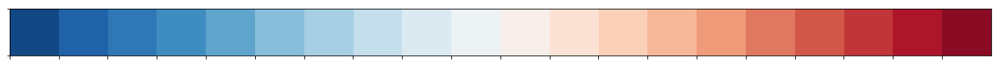

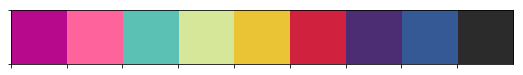

In [5]:
sns.palplot(sns.color_palette("RdBu_r", n_colors=20))
sns.palplot(sns.color_palette(["#b7098b","#ff639c", "#5bc1b5", 
                               "#d6e79a", "#eac435", "#d0213e", "#4c2c72", "#345995", 
                               "#2b2b2b"]))

In [6]:
color_matrix = pd.DataFrame()
df = subtype_meth_bigtable.drop_duplicates(subset="aliquot_barcode")

print(df['sample_type_name'].unique())
print(df['subtype'].unique())
print(df['triple_negative'].unique())

['Primary solid Tumor' 'Solid Tissue Normal' 'Metastatic']
['LumA' 'LumB' 'Normal' 'Basal' 'Her2' 'Unknown']
['Unknown' 'Yes']


In [7]:
c = dict(zip(df['sample_type_name'].unique(), ["#ff639c", "#5bc1b5", "#b7098b"]))
color_matrix['Sample type'] = df['sample_type_name'].map(c)

c = dict(zip(df['subtype'].unique(), ["#d6e79a", "#eac435", "#345995", "#d0213e", "#4c2c72", "#ffffff"]))
color_matrix['Subtype'] = df['subtype'].map(c)

c = dict(zip(df['triple_negative'].unique(), ["#ffffff", "#2b2b2b"]))
color_matrix['Triple negative'] = df['triple_negative'].map(c)

color_matrix.set_index(df['aliquot_barcode'], inplace=True)
color_matrix.head()

,Sample type,Subtype,Triple negative
aliquot_barcode,,,
TCGA-GM-A2DM-01A-11D-A17Z-05,#ff639c,#d6e79a,#ffffff
TCGA-AO-A0JJ-01A-11D-A10P-05,#ff639c,#d6e79a,#ffffff
TCGA-EW-A1J1-01A-11D-A13K-05,#ff639c,#d6e79a,#ffffff
TCGA-AC-A62V-01A-11D-A31V-05,#ff639c,#eac435,#ffffff
TCGA-EW-A1PC-01B-11D-A21R-05,#ff639c,#eac435,#ffffff


### data matrix - methylation data

In [8]:
distance = scipy.spatial.distance.squareform(1-corr)
linkage = scipy.cluster.hierarchy.linkage(distance, method='complete')
meth_matrix = subtype_meth_bigtable.pivot(index='probe_id', columns='aliquot_barcode', values='avg_beta_value')

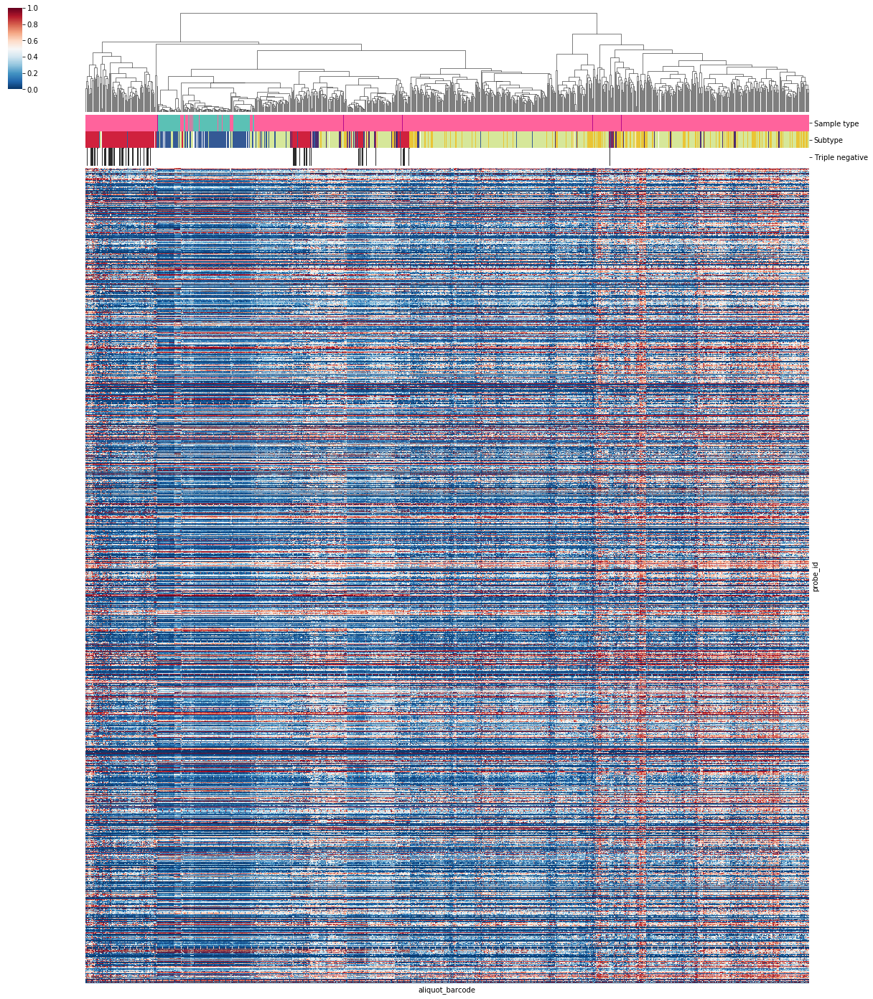

In [10]:
g = sns.clustermap(data=meth_matrix, 
                   col_linkage=linkage, row_cluster = False,
                   col_colors=color_matrix,
                   cmap="RdBu_r", vmin=0, vmax=1, figsize=(20,25), 
                   xticklabels=False, yticklabels=False)

In [11]:
g.savefig("./plots/cluster_meth.subtype.methdata.png")

### data matrix - correlation matrix

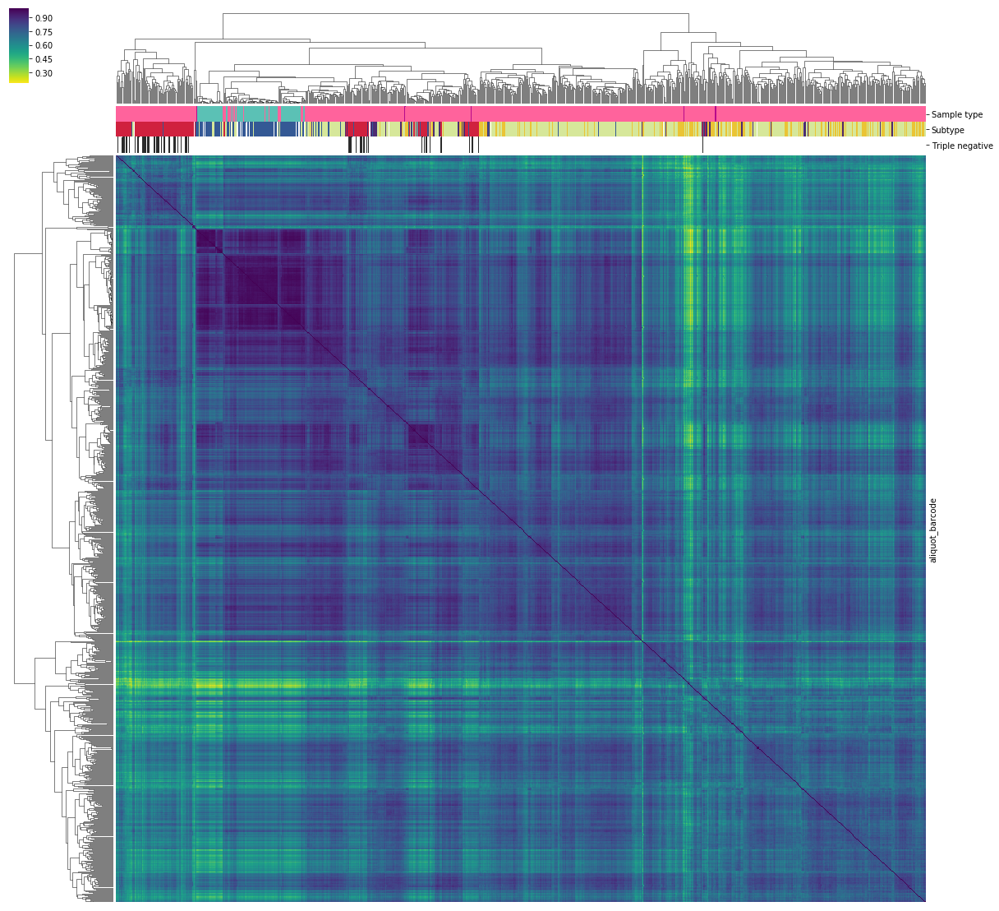

In [12]:
distance = scipy.spatial.distance.squareform(1-corr)
linkage = scipy.cluster.hierarchy.linkage(distance, method='complete')

g1 = sns.clustermap(data=corr, col_linkage=linkage, row_linkage=linkage,
                    col_colors=color_matrix,
                    cmap="viridis_r", vmax=1, figsize=(20,20), 
                    xticklabels=False, yticklabels=False)

In [13]:
g1.savefig("./plots/cluster_meth.subtype.corrdata.png")

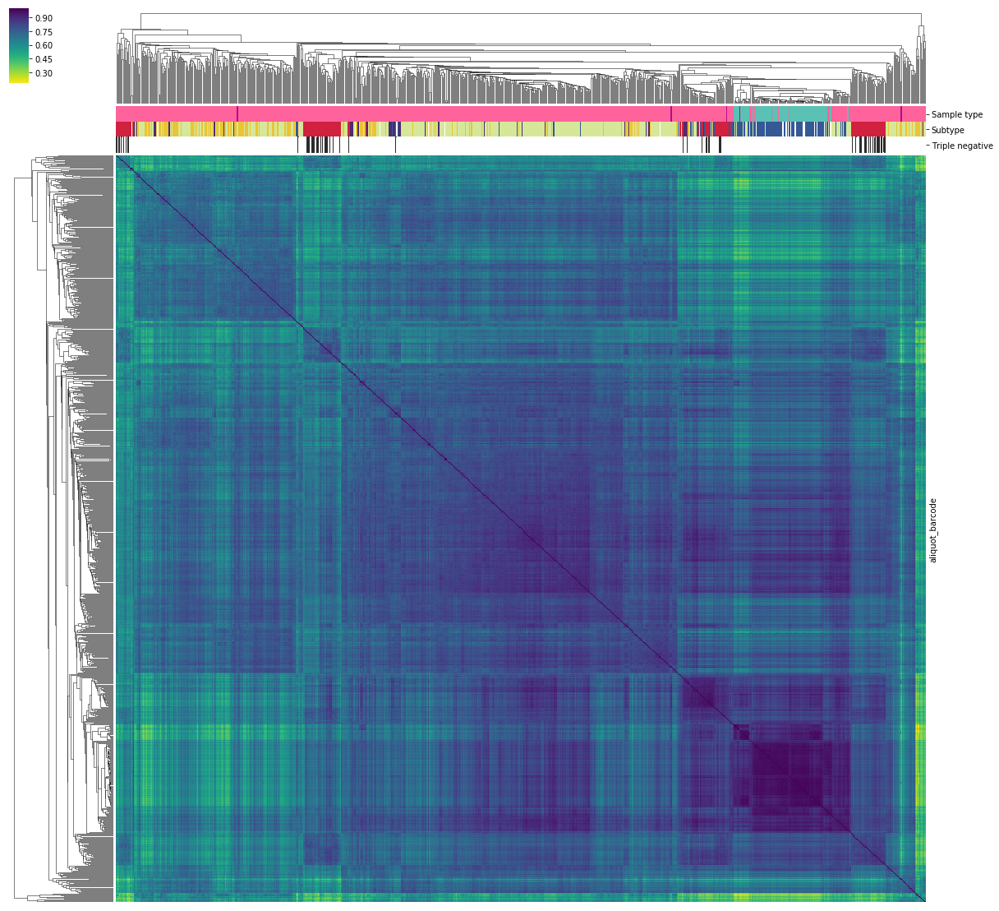

In [14]:
distance = scipy.spatial.distance.squareform(1-corr)
linkage = scipy.cluster.hierarchy.linkage(distance, method='average')

sns.clustermap(data=corr, col_linkage=linkage, row_linkage=linkage,
               col_colors=color_matrix,
               cmap="viridis_r", vmax=1, figsize=(20,20), 
               xticklabels=False, yticklabels=False)

# Exclude normal

In [15]:
exclude_normal = subtype_meth_bigtable.loc[subtype_meth_bigtable['sample_type'] != 11]
corr_excl_normal = corr.loc[list(exclude_normal['aliquot_barcode'].unique()), 
                            list(exclude_normal['aliquot_barcode'].unique())]

print(exclude_normal.shape)
print(exclude_normal.head())

print(corr_excl_normal.shape)

(18086484, 14)
   case_barcode    sample_barcode               aliquot_barcode    probe_id  \
0  TCGA-GM-A2DM  TCGA-GM-A2DM-01A  TCGA-GM-A2DM-01A-11D-A17Z-05  cg19996418   
1  TCGA-GM-A2DM  TCGA-GM-A2DM-01A  TCGA-GM-A2DM-01A-11D-A17Z-05  cg17657322   
2  TCGA-GM-A2DM  TCGA-GM-A2DM-01A  TCGA-GM-A2DM-01A-11D-A17Z-05  cg00872151   
3  TCGA-GM-A2DM  TCGA-GM-A2DM-01A  TCGA-GM-A2DM-01A-11D-A17Z-05  cg16608267   
4  TCGA-GM-A2DM  TCGA-GM-A2DM-01A  TCGA-GM-A2DM-01A-11D-A17Z-05  cg11289296   

   avg_beta_value  sample_type     sample_type_name subtype        ER  \
0            0.98            1  Primary solid Tumor    LumA  Positive   
1            0.98            1  Primary solid Tumor    LumA  Positive   
2            0.96            1  Primary solid Tumor    LumA  Positive   
3            0.97            1  Primary solid Tumor    LumA  Positive   
4            0.98            1  Primary solid Tumor    LumA  Positive   

         PR Her2_IHC Her2_ISH Her2 triple_negative  
0  Positive       

In [16]:
exclude_normal.drop_duplicates(subset="aliquot_barcode")['subtype'].unique()

array(['LumA', 'LumB', 'Basal', 'Her2', 'Normal', 'Unknown'], dtype=object)

In [18]:
exclude_normal.drop_duplicates(subset="aliquot_barcode")['triple_negative'].unique()

array(['Unknown', 'Yes'], dtype=object)

In [20]:
color_matrix = pd.DataFrame()
df = exclude_normal.drop_duplicates(subset="aliquot_barcode")

c = dict(zip(df['subtype'].unique(), ["#d6e79a", "#eac435", "#d0213e", "#4c2c72", "#345995", "#ffffff"]))
color_matrix['Subtype'] = df['subtype'].map(c)

c = dict(zip(df['triple_negative'].unique(), ["#ffffff", "#2b2b2b"]))
color_matrix['Triple negative'] = df['triple_negative'].map(c)

color_matrix.set_index(df['aliquot_barcode'], inplace=True)
color_matrix.head()

,Subtype,Triple negative
aliquot_barcode,,
TCGA-GM-A2DM-01A-11D-A17Z-05,#d6e79a,#ffffff
TCGA-AO-A0JJ-01A-11D-A10P-05,#d6e79a,#ffffff
TCGA-EW-A1J1-01A-11D-A13K-05,#d6e79a,#ffffff
TCGA-AC-A62V-01A-11D-A31V-05,#eac435,#ffffff
TCGA-EW-A1PC-01B-11D-A21R-05,#eac435,#ffffff


### data matrix - methylation data

In [21]:
distance = scipy.spatial.distance.squareform(1-corr_excl_normal)
linkage = scipy.cluster.hierarchy.linkage(distance, method='complete')
meth_matrix = subtype_meth_bigtable.pivot(
                                    index='probe_id', columns='aliquot_barcode', values='avg_beta_value'
                                    ).loc[:,list(exclude_normal['aliquot_barcode'].unique())]

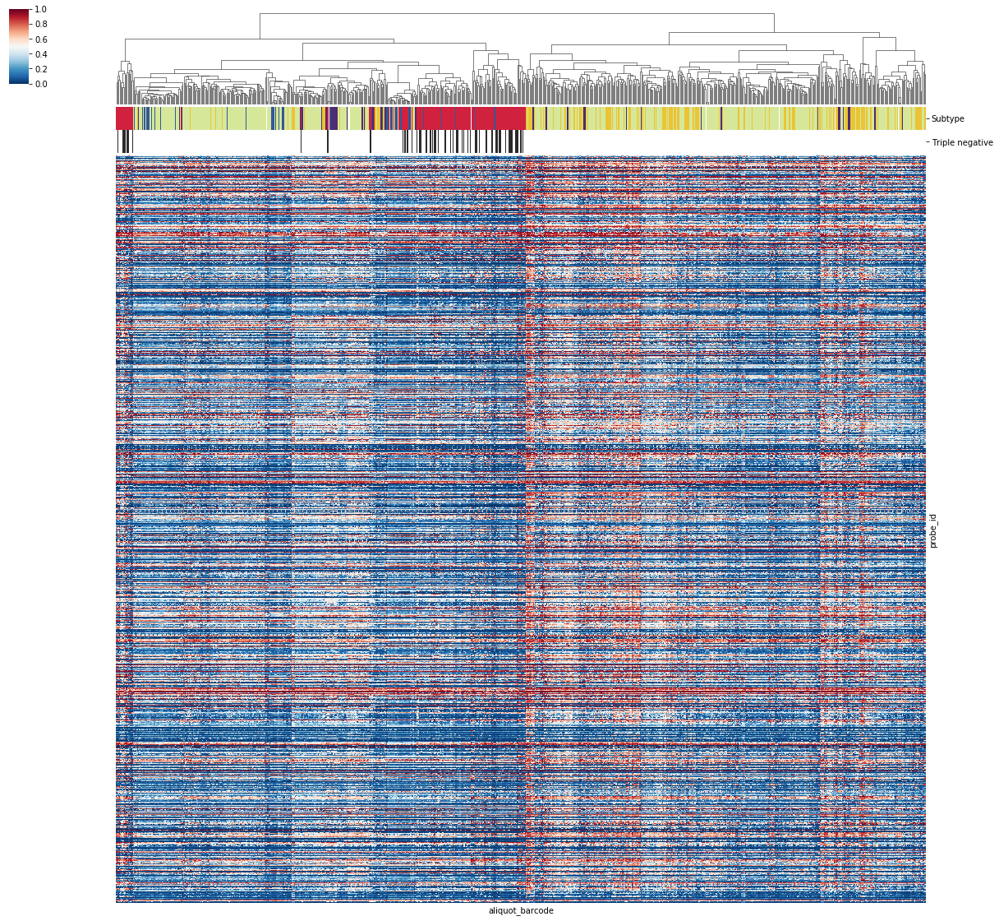

In [22]:
g2 = sns.clustermap(data=meth_matrix, 
                   col_linkage=linkage, row_cluster = False,
                   col_colors=color_matrix,
                   cmap="RdBu_r", vmin=0, vmax=1, figsize=(20,20), 
                   xticklabels=False, yticklabels=False)

In [23]:
g2.savefig("./plots/cluster_meth.subtype.exclNormal.methdata.png")

### data matrix - correlation data

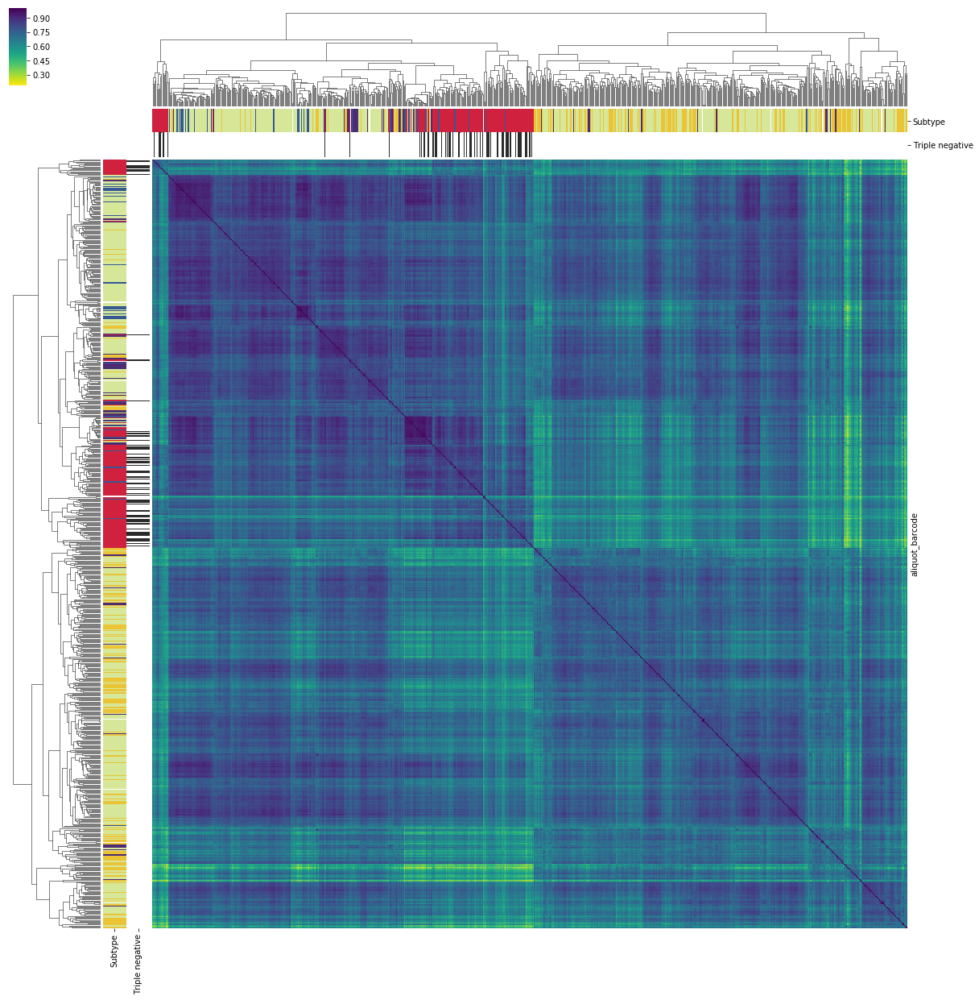

In [24]:
distance = scipy.spatial.distance.squareform(1-corr_excl_normal)
linkage = scipy.cluster.hierarchy.linkage(distance, method='complete')

g3 = sns.clustermap(data=corr_excl_normal, col_linkage=linkage, row_linkage=linkage,
                    row_colors=color_matrix, col_colors = color_matrix,
                    cmap="viridis_r", vmax=1, figsize=(20,21), 
                    xticklabels=False, yticklabels=False)

In [25]:
g3.savefig("./plots/cluster_meth.subtype.exclNormal.corrdata.png")

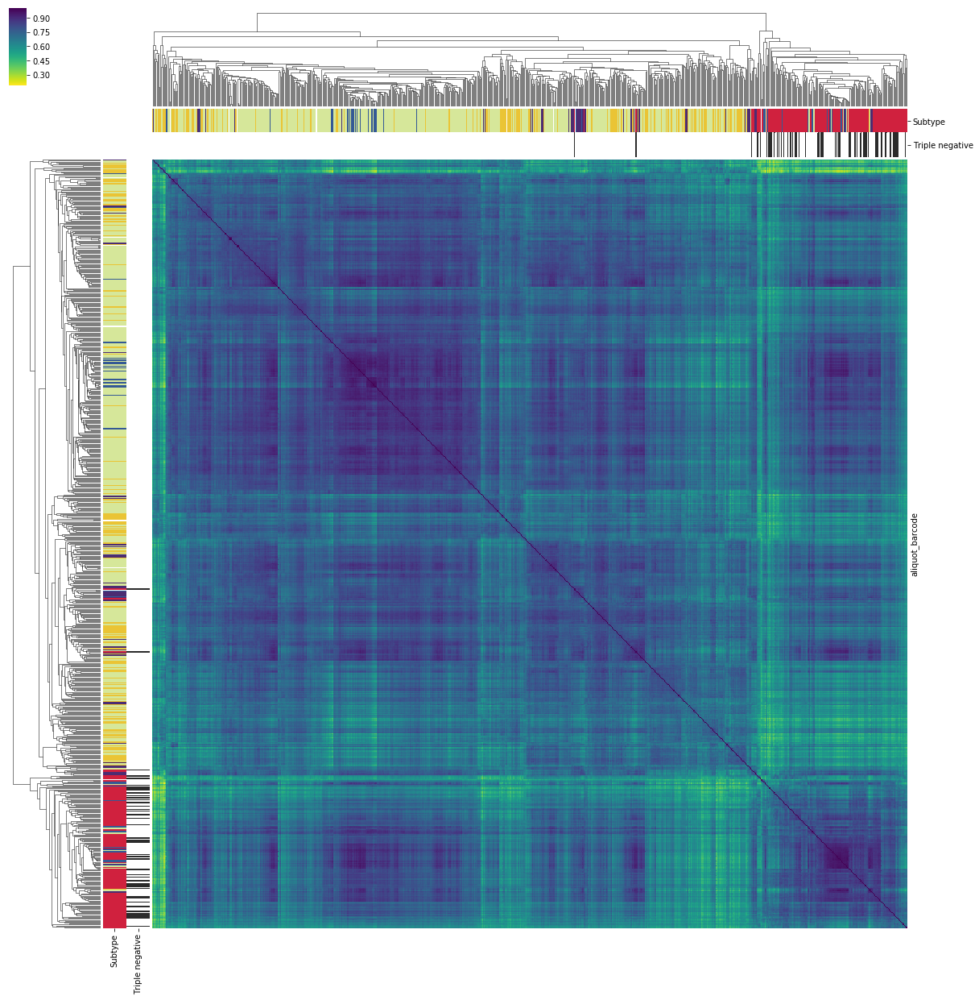

In [26]:
distance = scipy.spatial.distance.squareform(1-corr_excl_normal)
linkage = scipy.cluster.hierarchy.linkage(distance, method='weighted')

sns.clustermap(data=corr_excl_normal, col_linkage=linkage, row_linkage=linkage,
               row_colors=color_matrix, col_colors = color_matrix,
               cmap="viridis_r", vmax=1, figsize=(20,21), 
               xticklabels=False, yticklabels=False)

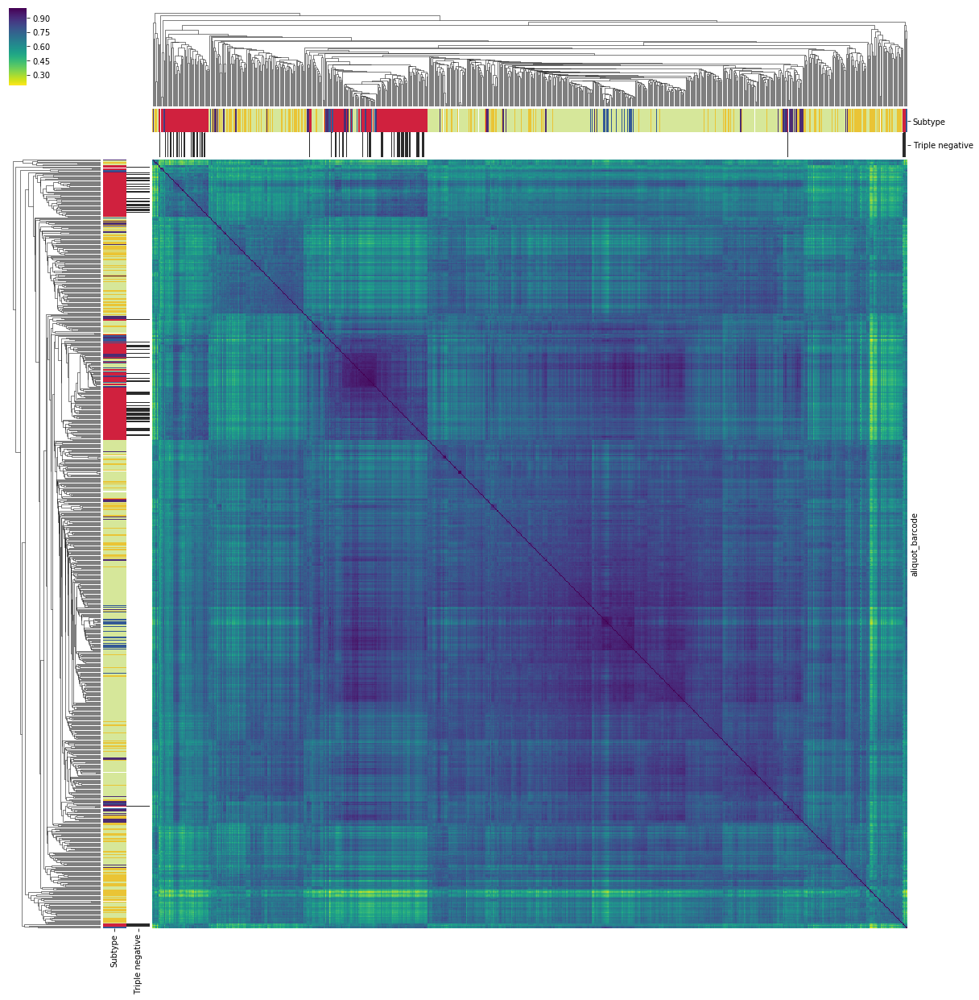

In [27]:
distance = scipy.spatial.distance.squareform(1-corr_excl_normal)
linkage = scipy.cluster.hierarchy.linkage(distance, method='average')

sns.clustermap(data=corr_excl_normal, col_linkage=linkage, row_linkage=linkage,
               row_colors=color_matrix, col_colors = color_matrix,
               cmap="viridis_r", vmax=1, figsize=(20,21), 
               xticklabels=False, yticklabels=False)

# Normal tissues only

In [28]:
normal_only = subtype_meth_bigtable.loc[subtype_meth_bigtable['sample_type'] == 11]
corr_normal = corr.loc[list(normal_only['aliquot_barcode'].unique()), 
                       list(normal_only['aliquot_barcode'].unique())]

print(normal_only.shape)
print(normal_only.head())

print(corr_normal.shape)

(2226968, 14)
        case_barcode    sample_barcode               aliquot_barcode  \
363634  TCGA-BH-A1FG  TCGA-BH-A1FG-11B  TCGA-BH-A1FG-11B-12D-A13T-05   
363635  TCGA-BH-A1FG  TCGA-BH-A1FG-11B  TCGA-BH-A1FG-11B-12D-A13T-05   
363636  TCGA-BH-A1FG  TCGA-BH-A1FG-11B  TCGA-BH-A1FG-11B-12D-A13T-05   
363637  TCGA-BH-A1FG  TCGA-BH-A1FG-11B  TCGA-BH-A1FG-11B-12D-A13T-05   
363638  TCGA-BH-A1FG  TCGA-BH-A1FG-11B  TCGA-BH-A1FG-11B-12D-A13T-05   

          probe_id  avg_beta_value  sample_type     sample_type_name subtype  \
363634  cg01831527            0.98           11  Solid Tissue Normal  Normal   
363635  cg14786290            0.95           11  Solid Tissue Normal  Normal   
363636  cg09881253            0.97           11  Solid Tissue Normal  Normal   
363637  cg05730676            0.95           11  Solid Tissue Normal  Normal   
363638  cg08824220            0.96           11  Solid Tissue Normal  Normal   

              ER        PR Her2_IHC Her2_ISH Her2 triple_negative  
3636

In [29]:
corr_normal.min().min()

0.7849954801855769

In [30]:
print(normal_only.drop_duplicates(subset="aliquot_barcode")['subtype'].unique())
normal_only.drop_duplicates(subset="aliquot_barcode")['subtype'].value_counts()

['Normal' 'LumA' 'Unknown']


Normal     76
Unknown    13
LumA        9
Name: subtype, dtype: int64

In [31]:
color_matrix = pd.DataFrame()
df = normal_only.drop_duplicates(subset="aliquot_barcode")

c = dict(zip(df['subtype'].unique(), ["#345995", "#ffffff", "#d6e79a"]))
color_matrix['Subtype'] = df['subtype'].map(c)

color_matrix.set_index(df['aliquot_barcode'], inplace=True)
color_matrix.head()

,Subtype
aliquot_barcode,
TCGA-BH-A1FG-11B-12D-A13T-05,#345995
TCGA-E9-A1RC-11A-33D-A161-05,#ffffff
TCGA-BH-A0B3-11B-21D-A10Q-05,#345995
TCGA-BH-A1FC-11A-32D-A13T-05,#345995
TCGA-AC-A23H-11A-12D-A161-05,#345995


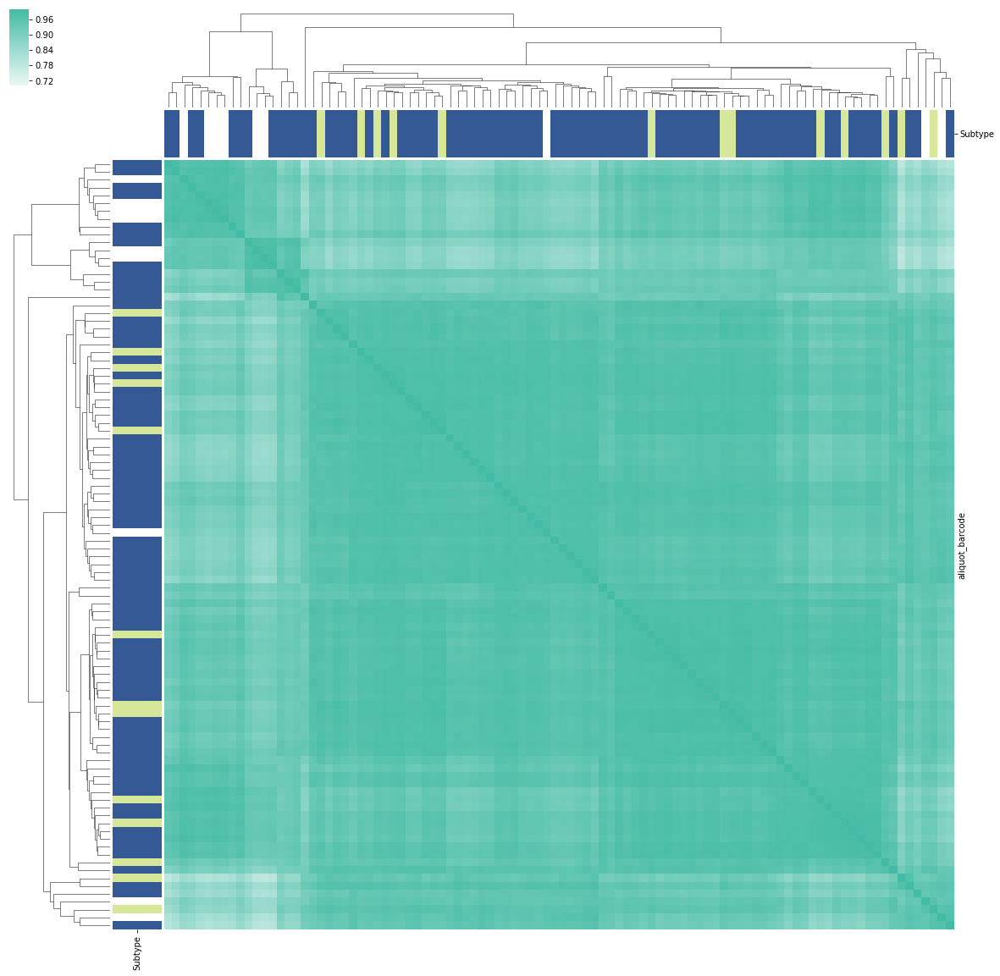

In [32]:
distance = scipy.spatial.distance.squareform(1-corr_normal)
linkage = scipy.cluster.hierarchy.linkage(distance, method='average')

sns.clustermap(data=corr_normal, col_linkage=linkage, row_linkage=linkage,
               row_colors=color_matrix, col_colors = color_matrix,
               cmap=sns.light_palette("#44bba4", input="hex", as_cmap=True), vmin=0.7, vmax=1, figsize=(20,20), 
               xticklabels=False, yticklabels=False)